# Polish Pictures Test Suite

In [4]:
import os
import glob
import math
import sys
import cv2
import matplotlib.pyplot as plt

# Ensure the src directory is importable from the notebook
workspace_root = os.getcwd()
src_root = os.path.join(workspace_root, "src")
if src_root not in sys.path:
    sys.path.insert(0, src_root)

from pipeline_manager import PipelineManager


def plot_ocr_folder_results(
    image_folder: str,
    detector_config_path: str,
    ocr_config_path: str,
    log_path: str = "logs/pipeline.log",
    extensions=("jpg", "jpeg", "png", "bmp"),
    ncols: int = 4,
    figsize=(20, 15),
    max_images=None
):
    """Run OCR on every image in a folder and plot the results in one figure."""
    image_folder = os.path.abspath(image_folder)
    if not os.path.isdir(image_folder):
        raise ValueError(f"Image folder not found: {image_folder}")

    image_paths = []
    for ext in extensions:
        image_paths.extend(sorted(glob.glob(os.path.join(image_folder, f"*.{ext}"))))
    image_paths = sorted(image_paths)
    if max_images is not None:
        image_paths = image_paths[:max_images]

    if len(image_paths) == 0:
        raise ValueError(f"No images found in {image_folder} for extensions: {extensions}")

    pipeline = PipelineManager(detector_config_path, ocr_config_path, log_path=log_path)
    results = []
    for image_path in image_paths:
        result = pipeline.run_pipeline(image_path)
        result["path"] = image_path
        results.append(result)

    n_images = len(results)
    ncols = min(ncols, n_images)
    nrows = math.ceil(n_images / ncols)

    fig, axs = plt.subplots(nrows, ncols, figsize=figsize)
    if isinstance(axs, plt.Axes):
        axs = [axs]
    else:
        axs = axs.flatten()

    for idx, result in enumerate(results):
        ax = axs[idx]
        image = result.get("annotated_image")
        if image is None:
            image = result.get("image")

        if image is None:
            ax.text(0.5, 0.5, "No image", ha="center", va="center")
            ax.set_axis_off()
            continue

        # Convert OpenCV BGR to RGB for display
        rgb_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        ax.imshow(rgb_image)

        text = result.get("text") or "No text"
        confidence = result.get("confidence", 0.0)
        label = f"{os.path.basename(result['path'])}\n{text}\nConfidence: {confidence:.2f}"
        ax.set_xlabel(label, fontsize=10)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_title(f"{idx + 1}/{n_images}", fontsize=10)

    for ax in axs[n_images:]:
        ax.set_axis_off()

    fig.tight_layout(rect=[0, 0.03, 1, 0.97])
    fig.suptitle(
        f"OCR results for folder: {os.path.basename(image_folder)}",
        fontsize=16,
        y=1.02,
    )

    return fig, results


# Example usage:
# fig, results = plot_ocr_folder_results(
#     image_folder="data/processed/images/test",
#     detector_config_path="config/detector_config_all.yaml",
#     ocr_config_path="config/ocr_config_all.yaml",
#     log_path="logs/pipeline_folder.log",
#     ncols=3,
#     max_images=12,
# )
# fig.show()

2026-06-20 18:07:07,249 [INFO] Logging successfully configured. Saving logs to: logs/rl_all.log
2026-06-20 18:07:07,250 [INFO] Initializing Pipeline Manager...
2026-06-20 18:07:07,251 [INFO] Initializing DateDetector with weights: /bakha/vhome/gpyda/scratch/Deep_Learning_Project/runs/detect/outputs/detector/run_20260620_170339/weights/best.pt
2026-06-20 18:07:07,564 [INFO] Initializing EasyOCR with languages: ['en']
2026-06-20 18:07:08,617 [INFO] Pipeline initialized successfully.
2026-06-20 18:07:08,619 [INFO] Processing image: /sekhemet/scratch/gpyda/Deep_Learning_Project/reallife_pictures/20260620_164132.jpg
2026-06-20 18:07:08,878 [INFO] Extracted Text: 26-05-2027
2026-06-20 18:07:08,886 [INFO] Processing image: /sekhemet/scratch/gpyda/Deep_Learning_Project/reallife_pictures/20260620_164142.jpg
2026-06-20 18:07:08,979 [INFO] Extracted Text: 62/08/27
2026-06-20 18:07:08,988 [INFO] Processing image: /sekhemet/scratch/gpyda/Deep_Learning_Project/reallife_pictures/20260620_164152.jpg
2

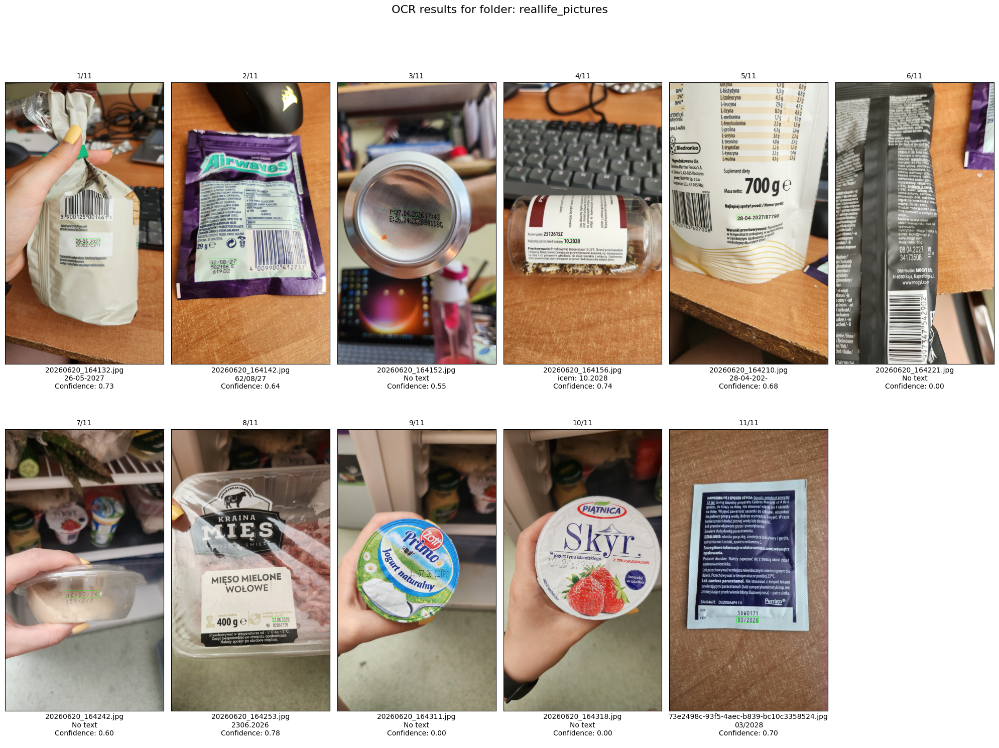

In [8]:
fig, results = plot_ocr_folder_results(
    image_folder="reallife_pictures",
    detector_config_path="config/det_use/detector_config_all.yaml",
    ocr_config_path="config/ocr/ocr_config_all.yaml",
    log_path="logs/rl_all.log",
    ncols=6,
    max_images=12,
)
fig.show()

2026-06-20 18:07:45,668 [INFO] Logging successfully configured. Saving logs to: logs/rl_dimun.log
2026-06-20 18:07:45,669 [INFO] Initializing Pipeline Manager...
2026-06-20 18:07:45,671 [INFO] Initializing DateDetector with weights: /bakha/vhome/gpyda/scratch/Deep_Learning_Project/runs/detect/outputs/detector/run_20260620_170343/weights/best.pt
2026-06-20 18:07:45,745 [INFO] Initializing EasyOCR with languages: ['en']
2026-06-20 18:07:46,893 [INFO] Pipeline initialized successfully.
2026-06-20 18:07:46,894 [INFO] Processing image: /sekhemet/scratch/gpyda/Deep_Learning_Project/reallife_pictures/20260620_164132.jpg
2026-06-20 18:07:47,162 [INFO] Extracted Text: 26-05-2027
2026-06-20 18:07:47,169 [INFO] Processing image: /sekhemet/scratch/gpyda/Deep_Learning_Project/reallife_pictures/20260620_164142.jpg
2026-06-20 18:07:47,263 [INFO] Extracted Text: 62/08. 2
2026-06-20 18:07:47,272 [INFO] Processing image: /sekhemet/scratch/gpyda/Deep_Learning_Project/reallife_pictures/20260620_164152.jpg

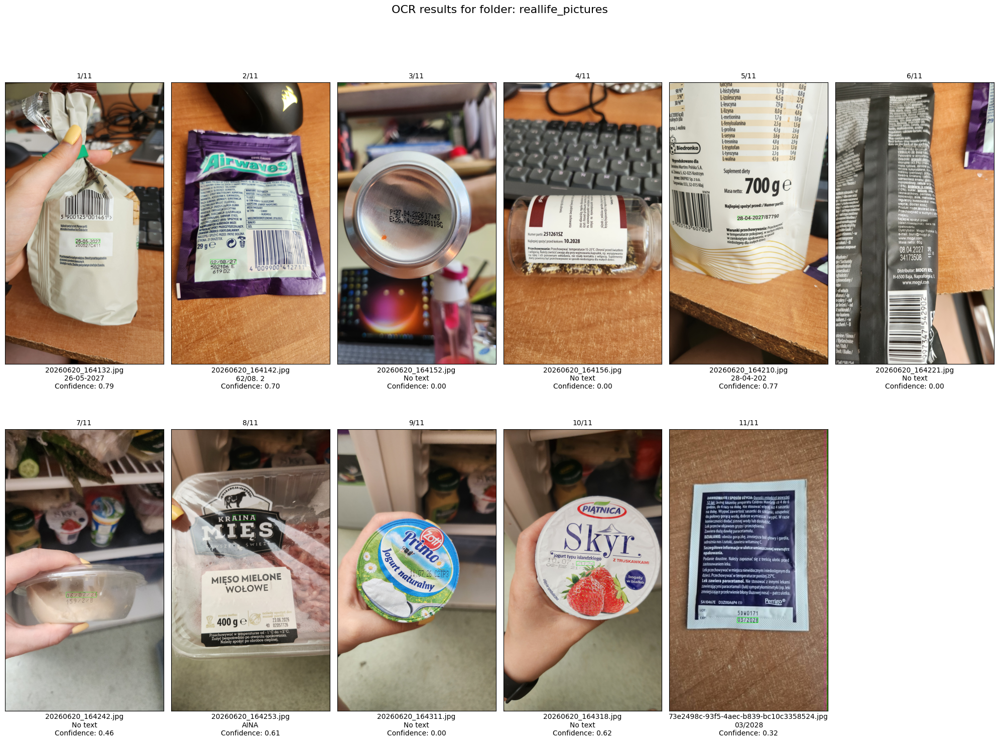

In [9]:
fig, results = plot_ocr_folder_results(
    image_folder="reallife_pictures",
    detector_config_path="config/det_use/detector_config_dimun.yaml",
    ocr_config_path="config/ocr/ocr_config_dimun.yaml",
    log_path="logs/rl_dimun.log",
    ncols=6,
    max_images=12,
)
fig.show()

2026-06-20 18:08:37,938 [INFO] Logging successfully configured. Saving logs to: logs/rl_korean.log
2026-06-20 18:08:37,939 [INFO] Initializing Pipeline Manager...
2026-06-20 18:08:37,940 [INFO] Initializing DateDetector with weights: /bakha/vhome/gpyda/scratch/Deep_Learning_Project/runs/detect/outputs/detector/run_20260620_170448/weights/best.pt
2026-06-20 18:08:38,016 [INFO] Initializing EasyOCR with languages: ['en']
2026-06-20 18:08:39,151 [INFO] Pipeline initialized successfully.
2026-06-20 18:08:39,153 [INFO] Processing image: /sekhemet/scratch/gpyda/Deep_Learning_Project/reallife_pictures/20260620_164132.jpg
2026-06-20 18:08:39,414 [INFO] Extracted Text: 26-05-2027
2026-06-20 18:08:39,422 [INFO] Processing image: /sekhemet/scratch/gpyda/Deep_Learning_Project/reallife_pictures/20260620_164142.jpg
2026-06-20 18:08:39,522 [INFO] Extracted Text: 62/08. 27
2026-06-20 18:08:39,529 [INFO] Processing image: /sekhemet/scratch/gpyda/Deep_Learning_Project/reallife_pictures/20260620_164152.j

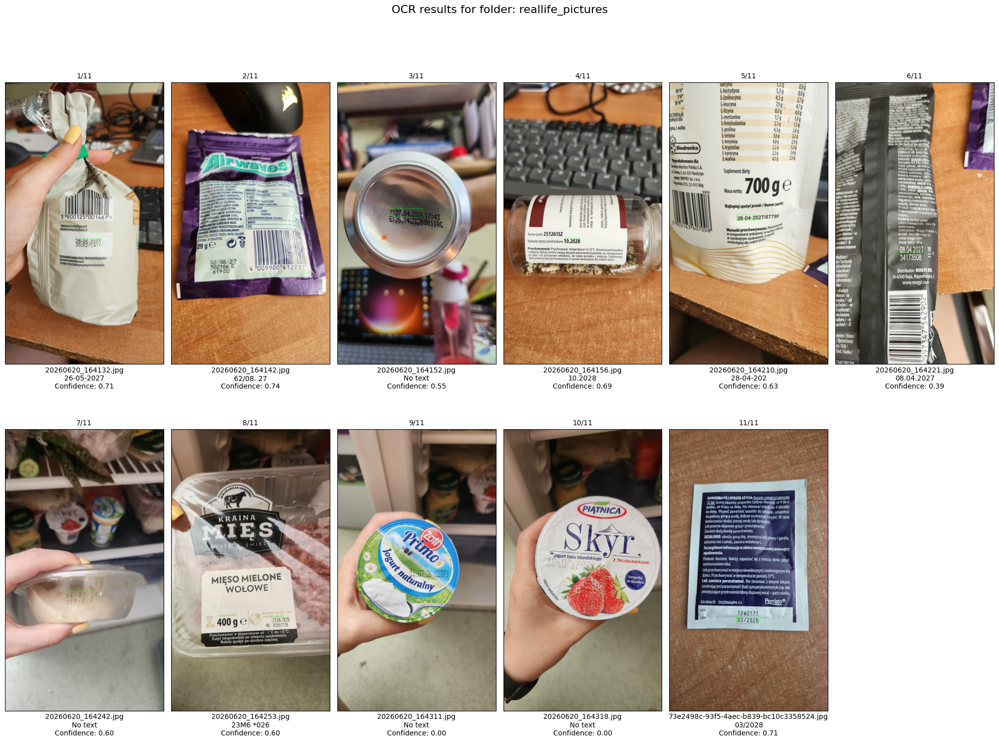

In [10]:
fig, results = plot_ocr_folder_results(
    image_folder="reallife_pictures",
    detector_config_path="config/det_use/detector_config_korean.yaml",
    ocr_config_path="config/ocr/ocr_config_korean.yaml",
    log_path="logs/rl_korean.log",
    ncols=6,
    max_images=12,
)
fig.show()